# Tareas pendientes

- [X] Unir data 2023-2024
- [X] Implementar ARIMA
- [X] Implementar LSTM
- [X] Implementar Prophet
- [X] Implementar mensaje en caso que no pueda predecir insumo
- [ ] Implementar medición error MSE - ARIMA
- [ ] Implementar medición error MSE - LSTM
- [ ] Implementar medición error MSE - Prophet
- [ ] Implementar mejor Pre-procesado (Feature Engineering por ejemplo)
- [ ] Exportar Modelo ARIMA
- [ ] Exportar Modelo LSTM
- [ ] Exportar Modelo Prophet
- [ ] Integrar data real

# Dataset Gob.pa

In [1]:
import pandas as pd
import os

In [2]:
# Definir las rutas de los archivos Excel

# 2022
enero_2022_path = 'datasets_xlsx/2022/cuadro-insumos-medico-quirurgico-enero-2022.xlsx'
feb_2022_path = 'datasets_xlsx/2022/inventario-de-insumos-medico-quirurgico-febrero-2022.xlsx'
marzo_2022_path = 'datasets_xlsx/2022/inventario-de-insumo-medico-quirurgico-marzo-2022.xlsx'
abril_2022_path = 'datasets_xlsx/2022/inventario-de-medicamentos-abril-2022.xlsx'
mayo_2022_path = 'datasets_xlsx/2022/inventario-de-insumo-medico-quirurgico-de-mayo-2022.xlsx'
junio_2022_path = 'datasets_xlsx/2022/inventario-insumos-medico-quirurgico-junio-2022.xlsx'
julio_2022_path = 'datasets_xlsx/2022/inventario-de-medico-quirurgico-julio-2022.xlsx'
agost_2022_path = 'datasets_xlsx/2022/inventario-de-insumos-medico-quirurgico-agosto-2022.xlsx'
sept_2022_path = 'datasets_xlsx/2022/inventario-de-insumos-medico-quirurgico-septiembre-2022.xlsx'
oct_2022_path = 'datasets_xlsx/2022/inventario-insumos-medico-quirurgico-octubre-2022.xlsx'
nov_2022_path = 'datasets_xlsx/2022/inventario-medico-quirurgico-nov.-2022.xlsx'
dic_2022_path = 'datasets_xlsx/2022/inventario-medico-quirugico-dic.-2022.xlsx'

# 2023
enero_2023_path = 'datasets_xlsx/2023/cuadro-de-inventario-insumos-medico-quirurgico-enero-2023.xlsx'
feb_2023_path = 'datasets_xlsx/2023/cuadro-de-inventario-insumos-medico-quirurgico-febrero-2023.xlsx'
marzo_2023_path = 'datasets_xlsx/2023/cuadro-de-inventario-insumos-medico-quirurgico-marzo-2023.xlsx'
abril_2023_path = 'datasets_xlsx/2023/cuadro-de-inventario-insumos-medico-quirurgico-abril-2023.xlsx'
mayo_2023_path = 'datasets_xlsx/2023/cuadro-de-inventario-de-medico-quirurgico-de-mayo-2023.xlsx'
junio_2023_path = 'datasets_xlsx/2023/cuadro-de-inventario-de-medico-quirurgico-de-junio-2023.xlsx'
julio_2023_path = 'datasets_xlsx/2023/cuadro-de-inventario-de-medico-quirurgico-de-julio-2023.xlsx'
agost_2023_path = 'datasets_xlsx/2023/cuadro-de-inventario-medico-quirurgico-agosto-2023.xlsx'
sept_2023_path = 'datasets_xlsx/2023/inventario-mq-a-septiembre-2023.xlsx'
oct_2023_path = 'datasets_xlsx/2023/cuadro-de-inventario-medico-quirurgico-octubre-2023.xlsx'
nov_2023_path = 'datasets_xlsx/2023/cuadro-de-inventario-medico-quirurgico-nov.-2023.xlsx'
dic_2023_path = 'datasets_xlsx/2023/cuadro-de-inventario-medico-quirurgico-dic.-2023.xlsx'

# 2024
enero_2024_path = 'datasets_xlsx/2024/cuadro-de-inventario-insumos-medico-quirurgico-enero-2024.xlsx'
feb_2024_path = 'datasets_xlsx/2024/cuadro-de-inventario-de-insumos-medicos-quirurgico-feb.-2024.xlsx'
marzo_2024_path = 'datasets_xlsx/2024/inventario-insumos-medico-quirurgico-marzo-2024.xlsx'
abril_2024_path = 'datasets_xlsx/2024/cuadro-de-inventario-mq-abril-2024.xlsx'

# Lista de rutas y meses correspondientes
file_paths = [
    enero_2022_path, feb_2022_path, marzo_2022_path, abril_2022_path,
    mayo_2022_path, junio_2022_path, julio_2022_path, agost_2022_path,
    sept_2022_path, oct_2022_path, nov_2022_path, dic_2022_path,
    enero_2023_path, feb_2023_path, marzo_2023_path, abril_2023_path,
    mayo_2023_path, junio_2023_path, julio_2023_path, agost_2023_path,
    sept_2023_path, oct_2023_path, nov_2023_path, dic_2023_path,
    enero_2024_path, feb_2024_path, marzo_2024_path, abril_2024_path
]

months = [
    '2022-01-01', '2022-02-01', '2022-03-01', '2022-04-01', '2022-05-01', '2022-06-01', 
    '2022-07-01', '2022-08-01', '2022-09-01', '2022-10-01', '2022-11-01', '2022-12-01',
    '2023-01-01', '2023-02-01', '2023-03-01', '2023-04-01', '2023-05-01', '2023-06-01', 
    '2023-07-01', '2023-08-01', '2023-09-01', '2023-10-01', '2023-11-01', '2023-12-01',
    '2024-01-01', '2024-02-01', '2024-03-01', '2024-04-01'
]

# Leer los archivos Excel en DataFrames y añadir una columna para el mes correspondiente
dfs = []

for file_path, month in zip(file_paths, months):
    df = pd.read_excel(file_path)
    df = df.iloc[:, [0, 1, -2]]  # Seleccionar las columnas por índice
    df['Fecha'] = month  # Añadir la columna de la fecha
    df = df.rename(columns={df.columns[2]: 'Inventario'})  # Renombrar la columna -2
    dfs.append(df)

# Concatenar todos los DataFrames
df_combined = pd.concat(dfs)

# Renombrar las columnas
df_combined.columns = ['Codigo', 'Insumo', 'Inventario', 'Fecha']

# Reordenar las columnas
df_combined = df_combined[['Fecha', 'Insumo', 'Inventario']]

In [3]:
df_combined

,Fecha,Insumo,Inventario
0,2022-01-01,NaN,NaN
1,2022-01-01,GALON GEL ALCOHOLADO AL 70% ALC,0.0
2,2022-01-01,CONECTOR PARA BOMBA DE INFUSION CON FILTRO DE ...,144980.0
3,2022-01-01,AGUJA PARA NEUMOPERITONEO (TIPO VERESS) PARA ...,175.0
4,2022-01-01,DETERGENTE ANIONICO EN POLVO PRESENTACION: PAQ...,2534.0
...,...,...,...
542,2024-04-01,FORRO DE COLCHON Para proteger el colchon del ...,0.0
543,2024-04-01,ENVASE PARA DESECHOS PUNZOCORTANTE( SE SOLICIT...,0.0
544,2024-04-01,ENVASE PARA DESECHOS PUNZOCORTANTE (SE SOLICIT...,0.0
545,2024-04-01,ENVASE PARA DESECHOS PUNZOCORTANTE (SE SOLICIT...,0.0


In [4]:
df_combined.info()

<class 'pandas.core.frame.DataFrame'>
Index: 14472 entries, 0 to 546
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Fecha       14472 non-null  object 
 1   Insumo      14458 non-null  object 
 2   Inventario  14460 non-null  float64
dtypes: float64(1), object(2)
memory usage: 452.2+ KB


In [5]:
df_combined.dropna(inplace=True)
# Convertir columna 'Inventario' a tipo int
df_combined['Inventario'] = df_combined['Inventario'].astype(int)
# Convertir la columna 'Fecha' a tipo datetime
df_combined['Fecha'] = pd.to_datetime(df_combined['Fecha'])

In [16]:
df_combined.columns

Index(['Fecha', 'Insumo', 'Inventario'], dtype='object')

In [17]:
df_combined.dropna(subset=['Insumo'], inplace=True)

In [18]:
df_combined.info()

<class 'pandas.core.frame.DataFrame'>
Index: 14458 entries, 1 to 546
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   Fecha       14458 non-null  datetime64[ns]
 1   Insumo      14458 non-null  object        
 2   Inventario  14458 non-null  float64       
dtypes: datetime64[ns](1), float64(1), object(1)
memory usage: 451.8+ KB


In [19]:
df_combined

,Fecha,Insumo,Inventario
1,2022-01-01,GALON GEL ALCOHOLADO AL 70% ALC,0.0
2,2022-01-01,CONECTOR PARA BOMBA DE INFUSION CON FILTRO DE ...,144980.0
3,2022-01-01,AGUJA PARA NEUMOPERITONEO (TIPO VERESS) PARA ...,175.0
4,2022-01-01,DETERGENTE ANIONICO EN POLVO PRESENTACION: PAQ...,2534.0
5,2022-01-01,"AGUJA HIPODÉRMICA, (SE SOLICITA CALIBRE 18G X...",316800.0
...,...,...,...
542,2024-04-01,FORRO DE COLCHON Para proteger el colchon del ...,0.0
543,2024-04-01,ENVASE PARA DESECHOS PUNZOCORTANTE( SE SOLICIT...,0.0
544,2024-04-01,ENVASE PARA DESECHOS PUNZOCORTANTE (SE SOLICIT...,0.0
545,2024-04-01,ENVASE PARA DESECHOS PUNZOCORTANTE (SE SOLICIT...,0.0


# ARIMA

## Entrenamiento

In [20]:
import pandas as pd
from statsmodels.tsa.arima.model import ARIMA
import matplotlib.pyplot as plt
import warnings
from statsmodels.tools.sm_exceptions import ConvergenceWarning

# Ignorar warnings de convergencia y otros warnings específicos de statsmodels
warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=ConvergenceWarning)

# Obtener la lista de insumos únicos
insumos = df_combined['Insumo'].unique()

# Lista para almacenar los resultados y los insumos predecibles
results = []
predecibles_arima = []

for insumo in insumos:
    # Filtrar los datos para el insumo actual
    df_insumo = df_combined[df_combined['Insumo'] == insumo].set_index('Fecha')
    df_insumo = df_insumo['Inventario']
    
    # Verificar que la serie temporal tenga al menos 2 puntos de datos
    if len(df_insumo) < 2:
        print(f"Not enough data for {insumo}")
        continue
    
    # Asegurar que los datos tengan frecuencia mensual y eliminar duplicados
    df_insumo = df_insumo[~df_insumo.index.duplicated(keep='first')]
    
    try:
        df_insumo = df_insumo.asfreq('MS')
    except ValueError as ve:
        print(f"Error setting frequency for {insumo}: {ve}")
        continue
    
    # Definir el modelo ARIMA
    try:
        model = ARIMA(df_insumo, order=(1, 1, 1))
        
        # Entrenar el modelo
        model_fit = model.fit()

        # Guardar el modelo entrenado
        #model_filename = f"{output_dir}/arima_model_{insumo.replace(' ', '_').replace('/', '_')}.pkl"
        #joblib.dump(model_fit, model_filename)
        
        # Hacer predicciones
        forecast = model_fit.forecast(steps=6)  # Pronosticar los próximos 6 meses
        
        # Almacenar los resultados
        result = pd.DataFrame({
            'Insumo': insumo,
            'Fecha': pd.date_range(start=df_insumo.index[-1], periods=7, freq='MS')[1:],  # Fechas de predicción
            'Predicción': forecast
        })
        results.append(result)
        predecibles_arima.append(insumo)
    
    except Exception as e:
        print(f"Error processing {insumo}: {e}")

# Convertir los resultados en un DataFrame
df_forecast = pd.concat(results)

# Mostrar el DataFrame de predicciones
print(df_forecast)

Not enough data for ENGRAPADORA  CIRCULAR CORTANTE CON YUNQUE ARTICULABLE PARA ANASTOMOSIS DIGESTIVA (Se solicita curvo, de 31mm, con grapas de altura mínima de 4.8mm abierta)
Not enough data for PLACA PARA IMPRESIÓN PLANTAR



Error processing TOALLITA SATURADA DE ALCOHOL : too many indices for array: array is 0-dimensional, but 1 were indexed
Not enough data for MICROGRANULOS A BASE DE ALGINATO DE SODIO Y UN ESTER DEL ACIDO Para el tratamiento de las heridas que secretan y purulentas, el material bactérico y los residuos celulares. Los gránulos estériles
se transforman en un suave gel coloidal que se adapta a la superficie de la lesión, contribuyendo a crear un microambiente de la
herida, ideales para la activación de los procesos reparativos naturales.

Especificaciones 

1.Microgránulos estériles.

2.A base de alginato de sodio y un éster ácido hialurónico, componentes naturales de la piel humana.

3.Tamaños: 

3.1. Bolsas de 2 gramos.
HIALURONICO
Not enough data for MATRIZ EXTRACE

C:\Users\kevin\anaconda3\envs\Feria\lib\site-packages\statsmodels\tsa\statespace\mlemodel.py:1234: RuntimeWarning: invalid value encountered in divide
  np.inner(score_obs, score_obs) /
C:\Users\kevin\anaconda3\envs\Feria\lib\site-packages\statsmodels\tsa\statespace\mlemodel.py:1234: RuntimeWarning: invalid value encountered in divide
  np.inner(score_obs, score_obs) /
C:\Users\kevin\anaconda3\envs\Feria\lib\site-packages\statsmodels\tsa\statespace\mlemodel.py:1234: RuntimeWarning: invalid value encountered in divide
  np.inner(score_obs, score_obs) /


Not enough data for METACRESOLSULFÓNICO ÁCIDO con FORMALDEHÍDO (POLICRESULENO) 36 - 41%, líquido, frasco, 10-25ml, Vía Tópica.
Not enough data for HOMATROPINA METILBROMURO 5mg/5ml, elixir, frasco, 120ml, V.O.
Not enough data for POTASIO GLUCONATO, 20MEQ/15ML, ELIXIR, FRASCO, 150-200ML, V.O.
Not enough data for MUCILOIDES HIDROFILICOS DERIVADOS DE PLANTAGINACEAE (EQUIVALENTE A UN MÍNIMO DE 49% DE PSYLLIUM), POLVO O CÁSCARA, FRASCO, 200-350G, V.O.
Not enough data for ALUMINIO Y MAGNESIO HIDRÓXIDO, 5.9-8.3% DE HIDRÓXIDOS TOTALES, GEL O SUSPENSIÓN, FRASCO, 150-240ML, V.O.                                  (180)
Not enough data for PASIFLORA, 500MG/5ML, SOLUCIÓN, FRASCO, V.O.
Not enough data for GUAYACOLATO DE GLICERILO, 100MG/5ML, JARABE, FRASCO, 120ML, V.O.
Not enough data for ALUMINIO ACETATO ÁCIDO, (ACETATO DE CALCIO Y SULFATO DE ALUMÍNIO), POLVO, SOBRE,  2-3G, VÍA TÓPICA.
Not enough data for TRIMETROPIN 40MG CON SULFAMETOXAZOL 200MG/5ML, SUSPENSIÓN  PEDIÁTRICA, FRASCO, 100-120ML, V.O.
N

C:\Users\kevin\anaconda3\envs\Feria\lib\site-packages\statsmodels\tsa\statespace\mlemodel.py:1234: RuntimeWarning: invalid value encountered in divide
  np.inner(score_obs, score_obs) /


Not enough data for PROTECTOR DE FLUIDOS Y PARTÍCULAS SECAS, TIPO PANTALÓN CON CUBRE CALZADO.
Error processing BANDEJA PARA CATETERIZACION VENOSO CENTRAL TRIPLE LUMEN CON 2 ANTIBIOTICOS (MINOCICLINA Y RIFAMPICINA). (Se Solicita Tamaño De 7fr x 20cms (CATETER DE POLIURETANO ADULTO).: too many indices for array: array is 0-dimensional, but 1 were indexed
Error processing ESPONJA HEMOSTATICA DE GELATINA ABSORBIBLE.   SE SOLICITA TAMAÑO 7CMx5CMx1CM ( 70MMX50MMX10MM): too many indices for array: array is 0-dimensional, but 1 were indexed
Error processing ENGRAPADORA CURVA CORTANTE PARA TEJIDO GRUESO (CIRUGIA COLON RECTAL).: too many indices for array: array is 0-dimensional, but 1 were indexed
Error processing BATA DESECHABLE, PARA USO GENERAL NO ESTERIL .AAMI  NIVEL 3.  (SE SOLICITA TAMAÑO MEDIANO).: too many indices for array: array is 0-dimensional, but 1 were indexed
Error processing BATA QUIRURGICA ESTERIL .AAMI NIVEL 3. (SE SOLICITA TAMAÑO MEDIANO):: too many indices for array: array 

## Insumos predecibles

In [21]:
# Mostrar los insumos que se pudieron predecir
print("Insumos predecibles:")
print(predecibles_arima)

Insumos predecibles:
['GALON GEL ALCOHOLADO AL 70% ALC     ', 'CONECTOR PARA BOMBA DE INFUSION CON FILTRO DE AIRE.', 'AGUJA PARA NEUMOPERITONEO  (TIPO VERESS) PARA LAPARASCOPIA (Se solicita 120mm)', 'DETERGENTE ANIONICO EN POLVO PRESENTACION: PAQ.DE 4 LIBRAS', 'AGUJA HIPODÉRMICA,  (SE SOLICITA CALIBRE 18G X 1  1/2 PULGADAS, 38MM DE LONGITUD)', 'AGUJA HIPODÉRMICA,   (SE SOLICITA CALIBRE 21G, 1 PULGADAS, 25MM DE LONGITUD.) ', 'AGUJA HIPODÉRMICA,  SE SOLICITA CALIBRE 21G X 1 1/2 PULGADAS, 38MM DE LONGITUD', 'AGUJA HIPODÉRMICA, SE SOLICITA CALIBRE 22G X 1 PULGADAS, 25MM DE LONGITUD', 'AGUJA HIPODÉRMICA    (SE SOLICITA CALIBRE 22G X 1 1/2 PULGADAS, 38MM DE LONGITUD)', 'AGUJA HIPODÉRMICA, (SE SOLICITA CALIBRE 23G X 1 PULGADAS 25MM DE LONGITUD)', 'AGUJA HIPODÉRMICA,   SE SOLICITA CALIBRE 24G X 1 PULGADAS 25MM DE LONGITUD', 'AGUJA HIPODÉRMICA DESECHABLE (Se solicita calibre 25G de 1" de longitud) ', 'AGUJA HIPODÉRMICA    (SE SOLICITA CALIBRE 25G X 1 1/2 PULGADAS, 38MM DE LONGITUD)', 'PAPEL SAT

## Predicción Producto

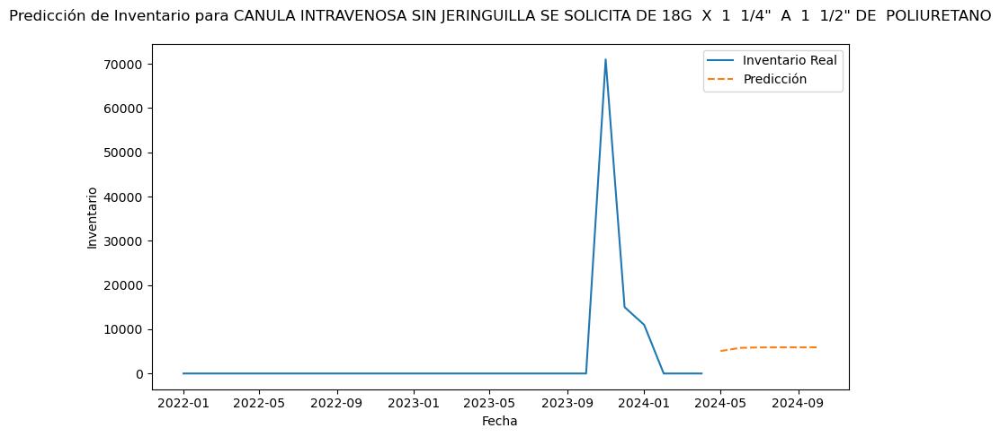

In [22]:
# Opcional: Visualizar las predicciones para un insumo específico
insumo = 'CANULA INTRAVENOSA SIN JERINGUILLA SE SOLICITA DE 18G  X  1  1/4"  A  1  1/2" DE  POLIURETANO\n'
# insumo = 'CONECTOR PARA BOMBA DE INFUSION CON FILTRO DE AIRE.'  # Reemplaza con el nombre de un insumo específico de tu interés
if insumo in predecibles_arima:
    df_insumo = df_combined[df_combined['Insumo'] == insumo].set_index('Fecha')['Inventario']
    df_pred = df_forecast[df_forecast['Insumo'] == insumo].set_index('Fecha')['Predicción']
    
    plt.figure(figsize=(10, 5))
    plt.plot(df_insumo, label='Inventario Real')
    plt.plot(df_pred, label='Predicción', linestyle='--')
    plt.legend()
    plt.title(f'Predicción de Inventario para {insumo}')
    plt.xlabel('Fecha')
    plt.ylabel('Inventario')
    plt.show()
else:
    print(f"No se pudo predecir para el insumo {insumo}")

## Error MSE

In [11]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error

# Supongamos que df_forecast es el DataFrame con las predicciones y df_combined es el DataFrame con los datos reales
mse_list = []
mae_list = []
mape_list = []

for insumo in predecibles_arima:
    # Filtrar los datos para el insumo actual
    df_real = df_combined[df_combined['Insumo'] == insumo].set_index('Fecha')['Inventario']
    df_pred = df_forecast[df_forecast['Insumo'] == insumo].set_index('Fecha')['Predicción']
    
    # Alinear las fechas
    df_real, df_pred = df_real.align(df_pred, join='inner')
    
    # Verificar que ambas series tengan datos después de la alineación
    if df_real.empty or df_pred.empty:
        print(f"No hay datos alineados para el insumo {insumo}")
        continue
    
    # Calcular las métricas de error
    mse = mean_squared_error(df_real, df_pred)
    mae = mean_absolute_error(df_real, df_pred)
    mape = mean_absolute_percentage_error(df_real, df_pred)
    
    mse_list.append((insumo, mse))
    mae_list.append((insumo, mae))
    mape_list.append((insumo, mape))

# Mostrar las métricas de error para cada insumo
print("MSE:")
for insumo, mse in mse_list:
    print(f"Insumo: {insumo}, MSE: {mse}")

print("\nMAE:")
for insumo, mae in mae_list:
    print(f"Insumo: {insumo}, MAE: {mae}")

print("\nMAPE:")
for insumo, mape in mape_list:
    print(f"Insumo: {insumo}, MAPE: {mape}")

No hay datos alineados para el insumo GALON GEL ALCOHOLADO AL 70% ALC     
No hay datos alineados para el insumo CONECTOR PARA BOMBA DE INFUSION CON FILTRO DE AIRE.
No hay datos alineados para el insumo AGUJA PARA NEUMOPERITONEO  (TIPO VERESS) PARA LAPARASCOPIA (Se solicita 120mm)
No hay datos alineados para el insumo DETERGENTE ANIONICO EN POLVO PRESENTACION: PAQ.DE 4 LIBRAS
No hay datos alineados para el insumo AGUJA HIPODÉRMICA,  (SE SOLICITA CALIBRE 18G X 1  1/2 PULGADAS, 38MM DE LONGITUD)
No hay datos alineados para el insumo AGUJA HIPODÉRMICA,   (SE SOLICITA CALIBRE 21G, 1 PULGADAS, 25MM DE LONGITUD.) 
No hay datos alineados para el insumo AGUJA HIPODÉRMICA,  SE SOLICITA CALIBRE 21G X 1 1/2 PULGADAS, 38MM DE LONGITUD
No hay datos alineados para el insumo AGUJA HIPODÉRMICA, SE SOLICITA CALIBRE 22G X 1 PULGADAS, 25MM DE LONGITUD
No hay datos alineados para el insumo AGUJA HIPODÉRMICA    (SE SOLICITA CALIBRE 22G X 1 1/2 PULGADAS, 38MM DE LONGITUD)
No hay datos alineados para el insu

# LSTM

## Entrenamiento

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator
import warnings

# Ignorar warnings de convergencia y otros warnings específicos
warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=FutureWarning)

# Supongamos que df_combined es el DataFrame consolidado
df_combined = pd.concat(dfs)

# Renombrar las columnas
df_combined.columns = ['Codigo', 'Insumo', 'Inventario', 'Fecha']

# Reordenar las columnas
df_combined = df_combined[['Fecha', 'Insumo', 'Inventario']]

# Convertir la columna 'Fecha' a tipo datetime
df_combined['Fecha'] = pd.to_datetime(df_combined['Fecha'])

# Manejar los valores NaN en la columna 'Inventario'
df_combined['Inventario'] = df_combined['Inventario'].fillna(0)  # Reemplaza NaN con 0 o algún valor apropiado

# Convertir la columna 'Inventario' a int
df_combined['Inventario'] = df_combined['Inventario'].astype(int)

# Obtener la lista de insumos únicos
insumos = df_combined['Insumo'].unique()

# Lista para almacenar los resultados y los insumos predecibles
results = []
predecibles_lstm = []

# Definir función para crear el modelo LSTM
def create_model(input_shape):
    model = Sequential()
    model.add(LSTM(50, activation='relu', input_shape=input_shape))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mse')
    return model

for insumo in insumos:
    # Filtrar los datos para el insumo actual
    df_insumo = df_combined[df_combined['Insumo'] == insumo].set_index('Fecha')
    df_insumo = df_insumo['Inventario']
    
    # Verificar que la serie temporal tenga al menos 12 puntos de datos
    if len(df_insumo) < 12:
        print(f"Not enough data for {insumo}")
        continue
    
    # Asegurar que los datos tengan frecuencia mensual y eliminar duplicados
    df_insumo = df_insumo[~df_insumo.index.duplicated(keep='first')]
    
    try:
        df_insumo = df_insumo.asfreq('MS')
    except ValueError as ve:
        print(f"Error setting frequency for {insumo}: {ve}")
        continue
    
    # Verificar nuevamente que después de eliminar duplicados y ajustar la frecuencia haya suficientes datos
    if len(df_insumo) < 12:
        print(f"Not enough data for {insumo} after setting frequency")
        continue
    
    # Escalar los datos
    scaler = MinMaxScaler()
    scaled_data = scaler.fit_transform(df_insumo.values.reshape(-1, 1))
    
    # Crear secuencias para el modelo LSTM
    generator = TimeseriesGenerator(scaled_data, scaled_data, length=12, batch_size=1)
    
    # Crear y entrenar el modelo
    model = create_model((12, 1))
    model.fit(generator, epochs=100, verbose=0)
    
    # Hacer predicciones para los próximos 6 meses
    pred_list = []
    batch = scaled_data[-12:].reshape((1, 12, 1))
    for i in range(6):
        pred = model.predict(batch)[0]
        pred_list.append(pred)
        batch = np.append(batch[:,1:,:], [[pred]], axis=1)
    
    # Invertir la escala de las predicciones
    forecast = scaler.inverse_transform(pred_list).flatten()
    
    # Almacenar los resultados
    result = pd.DataFrame({
        'Insumo': insumo,
        'Fecha': pd.date_range(start=df_insumo.index[-1], periods=7, freq='MS')[1:],  # Fechas de predicción
        'Predicción': forecast
    })
    results.append(result)
    predecibles_lstm.append(insumo)

# Convertir los resultados en un DataFrame
df_forecast = pd.concat(results)

# Mostrar el DataFrame de predicciones
print(df_forecast)

## Insumos predecibles

In [ ]:
# Mostrar los insumos que se pudieron predecir
print("Insumos predecibles:")
print(predecibles_lstm)

## Predicción Producto

In [ ]:
# Opcional: Visualizar las predicciones para un insumo específico
insumo = 'CONECTOR PARA BOMBA DE INFUSION CON FILTRO DE AIRE.' # Reemplaza con el nombre de un insumo específico de tu interés
if insumo in predecibles_lstm:
    df_insumo = df_combined[df_combined['Insumo'] == insumo].set_index('Fecha')['Inventario']
    df_pred = df_forecast[df_forecast['Insumo'] == insumo].set_index('Fecha')['Predicción']
    
    plt.figure(figsize=(10, 5))
    plt.plot(df_insumo, label='Inventario Real')
    plt.plot(df_pred, label='Predicción', linestyle='--')
    plt.legend()
    plt.title(f'Predicción de Inventario para {insumo}')
    plt.xlabel('Fecha')
    plt.ylabel('Inventario')
    plt.show()
else:
    print(f"No se pudo predecir para el insumo {insumo}")

## Error MSE

# Prophet

## Entrenamiento

In [30]:
import pandas as pd
from prophet import Prophet
import warnings

# Ignorar warnings de convergencia y otros warnings específicos
warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=FutureWarning)

# Supongamos que df_combined es el DataFrame consolidado
df_combined = pd.concat(dfs)

# Renombrar las columnas
df_combined.columns = ['Codigo', 'Insumo', 'Inventario', 'Fecha']

# Reordenar las columnas
df_combined = df_combined[['Fecha', 'Insumo', 'Inventario']]

# Convertir la columna 'Fecha' a tipo datetime
df_combined['Fecha'] = pd.to_datetime(df_combined['Fecha'])

# Manejar los valores NaN en la columna 'Inventario'
df_combined['Inventario'] = df_combined['Inventario'].fillna(0)  # Reemplaza NaN con 0 o algún valor apropiado

# Convertir la columna 'Inventario' a int
df_combined['Inventario'] = df_combined['Inventario'].astype(int)

# Obtener la lista de insumos únicos
insumos = df_combined['Insumo'].unique()

# Lista para almacenar los resultados y los insumos predecibles
results = []
predecibles_prophet = []

for insumo in insumos:
    # Filtrar los datos para el insumo actual
    df_insumo = df_combined[df_combined['Insumo'] == insumo][['Fecha', 'Inventario']].rename(columns={'Fecha': 'ds', 'Inventario': 'y'})
    
    # Verificar que la serie temporal tenga al menos 2 puntos de datos
    if len(df_insumo) < 2:
        print(f"Not enough data for {insumo}")
        continue
    
    try:
        # Definir y entrenar el modelo Prophet
        model = Prophet()
        model.fit(df_insumo)
        
        # Hacer predicciones
        future = model.make_future_dataframe(periods=6, freq='MS')
        forecast = model.predict(future)
        
        # Almacenar los resultados
        result = forecast[['ds', 'yhat']].rename(columns={'ds': 'Fecha', 'yhat': 'Predicción'})
        result['Insumo'] = insumo
        results.append(result[result['Fecha'] > df_insumo['ds'].max()])
        predecibles_prophet.append(insumo)
    
    except Exception as e:
        print(f"Error processing {insumo}: {e}")

# Convertir los resultados en un DataFrame
df_forecast = pd.concat(results)

# Mostrar el DataFrame de predicciones
print(df_forecast)


Not enough data for nan


22:41:49 - cmdstanpy - INFO - Chain [1] start processing
22:41:49 - cmdstanpy - INFO - Chain [1] done processing
22:41:50 - cmdstanpy - INFO - Chain [1] start processing
22:41:50 - cmdstanpy - INFO - Chain [1] done processing
22:41:50 - cmdstanpy - INFO - Chain [1] start processing
22:41:50 - cmdstanpy - INFO - Chain [1] done processing
22:41:50 - cmdstanpy - INFO - Chain [1] start processing
22:41:50 - cmdstanpy - INFO - Chain [1] done processing
22:41:51 - cmdstanpy - INFO - Chain [1] start processing
22:41:51 - cmdstanpy - INFO - Chain [1] done processing
22:41:51 - cmdstanpy - INFO - Chain [1] start processing
22:41:51 - cmdstanpy - INFO - Chain [1] done processing
22:41:51 - cmdstanpy - INFO - Chain [1] start processing
22:41:51 - cmdstanpy - INFO - Chain [1] done processing
22:41:51 - cmdstanpy - INFO - Chain [1] start processing
22:41:52 - cmdstanpy - INFO - Chain [1] done processing
22:41:52 - cmdstanpy - INFO - Chain [1] start processing
22:41:52 - cmdstanpy - INFO - Chain [1]

Not enough data for ENGRAPADORA  CIRCULAR CORTANTE CON YUNQUE ARTICULABLE PARA ANASTOMOSIS DIGESTIVA (Se solicita curvo, de 31mm, con grapas de altura mínima de 4.8mm abierta)


22:42:27 - cmdstanpy - INFO - Chain [1] done processing
22:42:27 - cmdstanpy - INFO - Chain [1] start processing
22:42:27 - cmdstanpy - INFO - Chain [1] done processing
22:42:27 - cmdstanpy - INFO - Chain [1] start processing
22:42:28 - cmdstanpy - INFO - Chain [1] done processing
22:42:28 - cmdstanpy - INFO - Chain [1] start processing
22:42:28 - cmdstanpy - INFO - Chain [1] done processing
22:42:28 - cmdstanpy - INFO - Chain [1] start processing
22:42:28 - cmdstanpy - INFO - Chain [1] done processing
22:42:29 - cmdstanpy - INFO - Chain [1] start processing
22:42:29 - cmdstanpy - INFO - Chain [1] done processing
22:42:29 - cmdstanpy - INFO - Chain [1] start processing
22:42:29 - cmdstanpy - INFO - Chain [1] done processing
22:42:29 - cmdstanpy - INFO - Chain [1] start processing
22:42:29 - cmdstanpy - INFO - Chain [1] done processing
22:42:30 - cmdstanpy - INFO - Chain [1] start processing
22:42:30 - cmdstanpy - INFO - Chain [1] done processing
22:42:30 - cmdstanpy - INFO - Chain [1] 

## Insumos predecibles

In [28]:
# Mostrar los insumos que se pudieron predecir
print("Insumos predecibles:")
print(predecibles_prophet)

Insumos predecibles:
['GALON GEL ALCOHOLADO AL 70% ALC     ', 'CONECTOR PARA BOMBA DE INFUSION CON FILTRO DE AIRE.', 'AGUJA PARA NEUMOPERITONEO  (TIPO VERESS) PARA LAPARASCOPIA (Se solicita 120mm)', 'DETERGENTE ANIONICO EN POLVO PRESENTACION: PAQ.DE 4 LIBRAS', 'AGUJA HIPODÉRMICA,  (SE SOLICITA CALIBRE 18G X 1  1/2 PULGADAS, 38MM DE LONGITUD)', 'AGUJA HIPODÉRMICA,   (SE SOLICITA CALIBRE 21G, 1 PULGADAS, 25MM DE LONGITUD.) ', 'AGUJA HIPODÉRMICA,  SE SOLICITA CALIBRE 21G X 1 1/2 PULGADAS, 38MM DE LONGITUD', 'AGUJA HIPODÉRMICA, SE SOLICITA CALIBRE 22G X 1 PULGADAS, 25MM DE LONGITUD', 'AGUJA HIPODÉRMICA    (SE SOLICITA CALIBRE 22G X 1 1/2 PULGADAS, 38MM DE LONGITUD)', 'AGUJA HIPODÉRMICA, (SE SOLICITA CALIBRE 23G X 1 PULGADAS 25MM DE LONGITUD)', 'AGUJA HIPODÉRMICA,   SE SOLICITA CALIBRE 24G X 1 PULGADAS 25MM DE LONGITUD', 'AGUJA HIPODÉRMICA DESECHABLE (Se solicita calibre 25G de 1" de longitud) ', 'AGUJA HIPODÉRMICA    (SE SOLICITA CALIBRE 25G X 1 1/2 PULGADAS, 38MM DE LONGITUD)', 'PAPEL SAT

## Predicción Producto

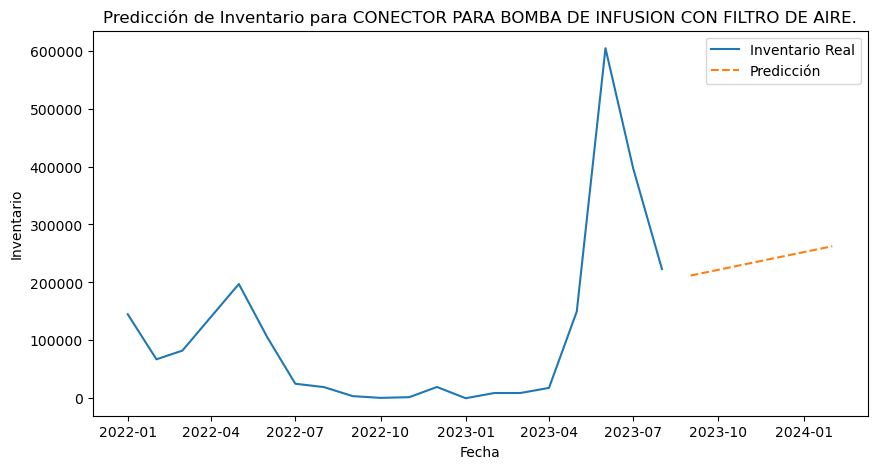

In [29]:
import matplotlib.pyplot as plt
# Opcional: Visualizar las predicciones para un insumo específico
insumo = 'CONECTOR PARA BOMBA DE INFUSION CON FILTRO DE AIRE.' # Reemplaza con el nombre de un insumo específico de tu interés
if insumo in predecibles_prophet:
    df_insumo = df_combined[df_combined['Insumo'] == insumo].set_index('Fecha')['Inventario']
    df_pred = df_forecast[df_forecast['Insumo'] == insumo].set_index('Fecha')['Predicción']
    
    plt.figure(figsize=(10, 5))
    plt.plot(df_insumo, label='Inventario Real')
    plt.plot(df_pred, label='Predicción', linestyle='--')
    plt.legend()
    plt.title(f'Predicción de Inventario para {insumo}')
    plt.xlabel('Fecha')
    plt.ylabel('Inventario')
    plt.show()
else:
    print(f"No se pudo predecir para el insumo {insumo}")

## Error MSE

# Consumo Calculado y Predicho

## Data

In [43]:
import pandas as pd
# Definir las rutas de los archivos Excel

# 2022
enero_2022_path = 'datasets_xlsx/2022/cuadro-insumos-medico-quirurgico-enero-2022.xlsx'
feb_2022_path = 'datasets_xlsx/2022/inventario-de-insumos-medico-quirurgico-febrero-2022.xlsx'
marzo_2022_path = 'datasets_xlsx/2022/inventario-de-insumo-medico-quirurgico-marzo-2022.xlsx'
abril_2022_path = 'datasets_xlsx/2022/inventario-de-medicamentos-abril-2022.xlsx'
mayo_2022_path = 'datasets_xlsx/2022/inventario-de-insumo-medico-quirurgico-de-mayo-2022.xlsx'
junio_2022_path = 'datasets_xlsx/2022/inventario-insumos-medico-quirurgico-junio-2022.xlsx'
julio_2022_path = 'datasets_xlsx/2022/inventario-de-medico-quirurgico-julio-2022.xlsx'
agost_2022_path = 'datasets_xlsx/2022/inventario-de-insumos-medico-quirurgico-agosto-2022.xlsx'
sept_2022_path = 'datasets_xlsx/2022/inventario-de-insumos-medico-quirurgico-septiembre-2022.xlsx'
oct_2022_path = 'datasets_xlsx/2022/inventario-insumos-medico-quirurgico-octubre-2022.xlsx'
nov_2022_path = 'datasets_xlsx/2022/inventario-medico-quirurgico-nov.-2022.xlsx'
dic_2022_path = 'datasets_xlsx/2022/inventario-medico-quirugico-dic.-2022.xlsx'
# 2023
enero_2023_path = 'datasets_xlsx/2023/cuadro-de-inventario-insumos-medico-quirurgico-enero-2023.xlsx'
feb_2023_path = 'datasets_xlsx/2023/cuadro-de-inventario-insumos-medico-quirurgico-febrero-2023.xlsx'
marzo_2023_path = 'datasets_xlsx/2023/cuadro-de-inventario-insumos-medico-quirurgico-marzo-2023.xlsx'
abril_2023_path = 'datasets_xlsx/2023/cuadro-de-inventario-insumos-medico-quirurgico-abril-2023.xlsx'
mayo_2023_path = 'datasets_xlsx/2023/cuadro-de-inventario-de-medico-quirurgico-de-mayo-2023.xlsx'
junio_2023_path = 'datasets_xlsx/2023/cuadro-de-inventario-de-medico-quirurgico-de-junio-2023.xlsx'
julio_2023_path = 'datasets_xlsx/2023/cuadro-de-inventario-de-medico-quirurgico-de-julio-2023.xlsx'
agost_2023_path = 'datasets_xlsx/2023/cuadro-de-inventario-medico-quirurgico-agosto-2023.xlsx'
sept_2023_path = 'datasets_xlsx/2023/inventario-mq-a-septiembre-2023.xlsx'
oct_2023_path = 'datasets_xlsx/2023/cuadro-de-inventario-medico-quirurgico-octubre-2023.xlsx'
nov_2023_path = 'datasets_xlsx/2023/cuadro-de-inventario-medico-quirurgico-nov.-2023.xlsx'
dic_2023_path = 'datasets_xlsx/2023/cuadro-de-inventario-medico-quirurgico-dic.-2023.xlsx'

# 2024
enero_2024_path = 'datasets_xlsx/2024/cuadro-de-inventario-insumos-medico-quirurgico-enero-2024.xlsx'
feb_2024_path = 'datasets_xlsx/2024/cuadro-de-inventario-de-insumos-medicos-quirurgico-feb.-2024.xlsx'
marzo_2024_path = 'datasets_xlsx/2024/inventario-insumos-medico-quirurgico-marzo-2024.xlsx'
abril_2024_path = 'datasets_xlsx/2024/cuadro-de-inventario-mq-abril-2024.xlsx'

# Lista de rutas y meses correspondientes
file_paths = [
    enero_2022_path, feb_2022_path, marzo_2022_path, abril_2022_path,
    mayo_2022_path, junio_2022_path, julio_2022_path, agost_2022_path,
    sept_2022_path, oct_2022_path, nov_2022_path, dic_2022_path,
    enero_2023_path, feb_2023_path, marzo_2023_path, abril_2023_path,
    mayo_2023_path, junio_2023_path, julio_2023_path, agost_2023_path,
    sept_2023_path, oct_2023_path, nov_2023_path, dic_2023_path,
    enero_2024_path, feb_2024_path, marzo_2024_path, abril_2024_path
]

months = [
    '2022-01-01', '2022-02-01', '2022-03-01', '2022-04-01', '2022-05-01', '2022-06-01', 
    '2022-07-01', '2022-08-01', '2022-09-01', '2022-10-01', '2022-11-01', '2022-12-01',
    '2023-01-01', '2023-02-01', '2023-03-01', '2023-04-01', '2023-05-01', '2023-06-01', 
    '2023-07-01', '2023-08-01', '2023-09-01', '2023-10-01', '2023-11-01', '2023-12-01',
    '2024-01-01', '2024-02-01', '2024-03-01', '2024-04-01'
]

# Leer los archivos Excel en DataFrames y añadir una columna para el mes correspondiente
dfs = []

for file_path, month in zip(file_paths, months):
    df = pd.read_excel(file_path)
    df = df.iloc[:, [0, 1, -2]]  # Seleccionar las columnas por índice
    df['Fecha'] = month  # Añadir la columna de la fecha
    df = df.rename(columns={df.columns[2]: 'Inventario'})  # Renombrar la columna -2
    dfs.append(df)

# Concatenar todos los DataFrames
df_combined = pd.concat(dfs)

# Renombrar las columnas
df_combined.columns = ['Codigo', 'Insumo', 'Inventario', 'Fecha']

# Reordenar las columnas
df_combined = df_combined[['Fecha', 'Insumo', 'Inventario']]

# Contar el número de ceros por cada 'Insumo'
def count_zeros(df):
    return (df['Inventario'] == 0).sum()

# Filtrar los insumos con al menos 2 ceros
filtered_insumos = df_combined.groupby('Insumo').filter(lambda x: count_zeros(x) <= 2)

pivot_table = filtered_insumos.pivot_table(
    index='Insumo',         # Las filas serán las fechas
    columns='Fecha',      # Las columnas serán los insumos
    values='Inventario',   # Los valores serán los inventarios
    aggfunc='sum'          # La función de agregación será la suma (aunque debería ser única por cada insumo y fecha)
).fillna(0)
# Contar los ceros en cada fila
zero_counts = (pivot_table == 0).sum(axis=1)

# Filtrar las filas que tienen a lo sumo 2 ceros
filtered_pivot_table = pivot_table[zero_counts <= 2]

# Calcular el consumo (diferencia de inventarios entre meses consecutivos)
consumption = filtered_pivot_table.diff(axis=1).fillna(0)
consumption

Fecha,2022-01-01,2022-02-01,2022-03-01,2022-04-01,2022-05-01,2022-06-01,2022-07-01,2022-08-01,2022-09-01,2022-10-01,...,2023-07-01,2023-08-01,2023-09-01,2023-10-01,2023-11-01,2023-12-01,2024-01-01,2024-02-01,2024-03-01,2024-04-01
Insumo,,,,,,,,,,,,,,,,,,,,,
APOSITO OCULAR ADULTO ESTERIL,0.0,-15970.0,-37130.0,-73090.0,90400.0,-4550.0,-9200.0,-20500.0,-39400.0,45650.0,...,-89200.0,-20025.0,-12900.0,12900.0,0.0,6450.0,-12900.0,0.0,-1350.0,-13200.0
BANDAS ELÁSTICAS PARA FORTALECIMIENTO (SE SOLICITA -SUPER FUERTE),0.0,-15.0,-21.0,-45.0,518.0,-20.0,87.0,-402.0,-122.0,495.0,...,-19.0,-34.0,-38.0,8.0,0.0,7.0,-14.0,0.0,7.0,0.0
BANDAS ELÁSTICAS PARA FORTALECIMIENTO (SE SOLICITA FUERTE),0.0,-218.0,30.0,-62.0,256.0,-24.0,713.0,-183.0,-508.0,762.0,...,-276.0,-28.0,-251.0,235.0,-4.0,-62.0,-319.0,-18.0,7.0,-64.0
BANDAS ELÁSTICAS PARA FORTALECIMIENTO. (SE SOLICITA SUAVE),0.0,-255.0,-18.0,-54.0,70.0,-2.0,0.0,307.0,-250.0,307.0,...,-72.0,-18.0,-30.0,15.0,0.0,9.0,-18.0,-4.0,-1.0,-2.0
BOLSA COLECTORA DE ORINA DE 30 A 35 ONZA DE CAPACIDAD (900CC A 1050CC) DE PIERNA .,0.0,-9326.0,-45808.0,-40162.0,33744.0,-11920.0,-4364.0,-10460.0,-6520.0,38.0,...,-3188.0,-692.0,-172.0,164638.0,-21528.0,4514.0,-61254.0,-17618.0,15522.0,178.0
BOLSA INFUSORA A PRESION .SE SOLICITA BOLSA DE 1000cc DE CAPACIDAD,0.0,0.0,-165.0,-495.0,420.0,0.0,0.0,-105.0,-210.0,105.0,...,-85.0,0.0,-170.0,170.0,0.0,85.0,-170.0,0.0,85.0,0.0
BRAZALETE DE IDENTIFICACIÓN PARA ADULTOS. (SE SOLICITA: 12 PULGADAS DE LONGITUD),0.0,-347400.0,-2130000.0,-6067000.0,7498600.0,-103600.0,-34900.0,-1883000.0,-3673600.0,5404500.0,...,-1602100.0,-45500.0,-2966800.0,2936860.0,4700.0,-15500.0,-1638740.0,-2547352.0,97444.0,2248032.0
BRAZALETE DE IDENTIFICACIÓN PEDIATRICA. SE SOLICITA: 8 PULGADAS DE LONGITUD,0.0,-176000.0,-387300.0,-1315900.0,2225200.0,-11500.0,-28200.0,-542700.0,-1095200.0,1616800.0,...,-524400.0,-10300.0,-1070200.0,846500.0,-21900.0,7800.0,-459000.0,-768600.0,-1585.0,725285.0
CANULA NASOFARINGEA DE 20 FR A 26 FR. (SE SOLOCITA TAMAÑ0 26FR),0.0,-44400.0,-700.0,-2100.0,2800.0,0.0,0.0,-700.0,-1400.0,2100.0,...,-3170.0,0.0,-6340.0,3500.0,0.0,-20.0,-2500.0,0.0,2440.0,0.0


In [44]:
consumption.info()

<class 'pandas.core.frame.DataFrame'>
Index: 59 entries, APOSITO OCULAR ADULTO ESTERIL to VENDA DE YESO     (SE SOLICITA DE FRAGUADO RÁPIDO DE 3" X 3 YARDAS, DE MAXIMO DE 5 MINUTOS)
Data columns (total 28 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   2022-01-01  59 non-null     float64
 1   2022-02-01  59 non-null     float64
 2   2022-03-01  59 non-null     float64
 3   2022-04-01  59 non-null     float64
 4   2022-05-01  59 non-null     float64
 5   2022-06-01  59 non-null     float64
 6   2022-07-01  59 non-null     float64
 7   2022-08-01  59 non-null     float64
 8   2022-09-01  59 non-null     float64
 9   2022-10-01  59 non-null     float64
 10  2022-11-01  59 non-null     float64
 11  2022-12-01  59 non-null     float64
 12  2023-01-01  59 non-null     float64
 13  2023-02-01  59 non-null     float64
 14  2023-03-01  59 non-null     float64
 15  2023-04-01  59 non-null     float64
 16  2023-05-01  59 non-null     float64
 17  2

## ARIMA

In [45]:
import pandas as pd
from statsmodels.tsa.arima.model import ARIMA
import warnings
from statsmodels.tools.sm_exceptions import ConvergenceWarning

# Ignorar warnings de convergencia y otros warnings específicos de statsmodels
warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=ConvergenceWarning)

# Obtener la lista de insumos únicos
insumos = consumption.index.unique()

# Lista para almacenar los insumos predecibles y las predicciones
predecibles_arima = []
results = []

for insumo in insumos:
    # Filtrar los datos para el insumo actual
    df_insumo_consumo = consumption.loc[insumo]
    
    # Verificar que la serie temporal tenga al menos 2 puntos de datos
    if len(df_insumo_consumo) < 2:
        print(f"Not enough data for {insumo}")
        continue
    
    # Asegurar que los datos tengan frecuencia mensual y eliminar duplicados
    df_insumo_consumo = df_insumo_consumo[~df_insumo_consumo.index.duplicated(keep='first')]
    
    try:
        df_insumo_consumo = df_insumo_consumo.asfreq('MS')
    except ValueError as ve:
        print(f"Error setting frequency for {insumo}: {ve}")
        continue
    
    # Definir el modelo ARIMA
    try:
        model = ARIMA(df_insumo_consumo, order=(8, 2, 1))
        
        # Entrenar el modelo
        model_fit = model.fit()
        
        # Hacer predicciones para los próximos 6 meses
        forecast = model_fit.forecast(steps=6)  # Pronosticar los próximos 6 meses
        
        # Almacenar los resultados
        result = pd.DataFrame({
            'Insumo': insumo,
            'Fecha': pd.date_range(start=df_insumo_consumo.index[-1], periods=7, freq='MS')[1:],  # Fechas de predicción
            'Predicción': forecast
        })
        results.append(result)
        predecibles_arima.append(insumo)
    
    except Exception as e:
        print(f"Error processing {insumo}: {e}")

# Convertir los resultados en un DataFrame
df_forecast = pd.concat(results)

# Mostrar los insumos predecibles
print("Insumos predecibles:")
print(predecibles_arima)


Insumos predecibles:
['APOSITO OCULAR ADULTO ESTERIL', 'BANDAS ELÁSTICAS PARA FORTALECIMIENTO                     (SE SOLICITA -SUPER FUERTE)', 'BANDAS ELÁSTICAS PARA FORTALECIMIENTO                     (SE SOLICITA FUERTE) ', 'BANDAS ELÁSTICAS PARA FORTALECIMIENTO.                    (SE SOLICITA SUAVE)', 'BOLSA COLECTORA DE ORINA DE 30 A 35 ONZA DE CAPACIDAD     (900CC A 1050CC) DE PIERNA . ', 'BOLSA INFUSORA A PRESION .SE SOLICITA BOLSA DE 1000cc DE CAPACIDAD', 'BRAZALETE DE IDENTIFICACIÓN PARA ADULTOS.                (SE SOLICITA: 12 PULGADAS DE LONGITUD)', 'BRAZALETE DE IDENTIFICACIÓN PEDIATRICA. SE SOLICITA: 8 PULGADAS DE LONGITUD', 'CANULA NASOFARINGEA  DE 20 FR A  26 FR.  (SE SOLOCITA TAMAÑ0 26FR) ', 'CANULA NASOFARINGEA  DE 28 FR A 30 FR. SE SOLOCITA TAMAÑ0 28FR   ', 'CANULA NASOFARINGEA  DE 28 FR A 30 FR. SE SOLOCITA TAMAÑ0 30FR      ', 'CANULA NASOFARINGEA  DE 32 FR A 36 FR.                        (SE SOLOCITA TAMAÑ0 34FR)', 'CANULA NASOFARINGEA  DE 32 FR A 36 FR.  (SE SOLOC

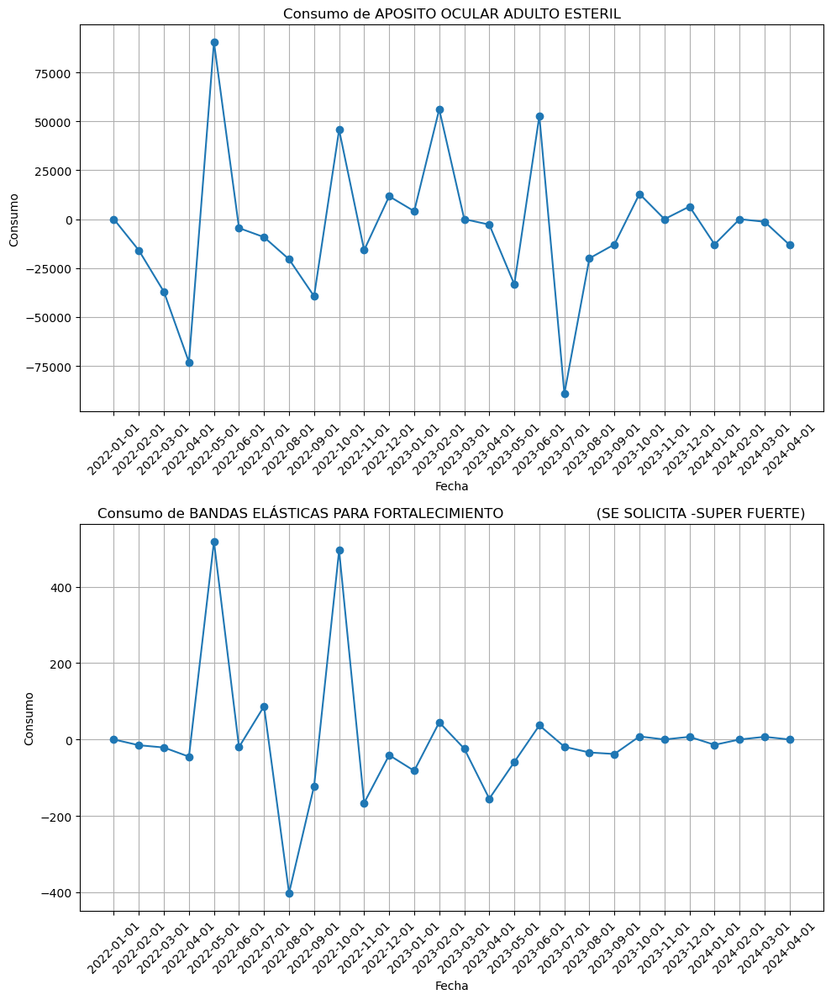

In [47]:
import matplotlib.pyplot as plt

# Seleccionar varios insumos
insumos = ['APOSITO OCULAR ADULTO ESTERIL', 'BANDAS ELÁSTICAS PARA FORTALECIMIENTO                     (SE SOLICITA -SUPER FUERTE)']  # Reemplaza con los nombres de los insumos que quieras graficar

# Crear subplots para cada insumo
fig, axs = plt.subplots(len(insumos), 1, figsize=(10, 6 * len(insumos)))

# Si solo hay un insumo, `axs` no será una lista
if len(insumos) == 1:
    axs = [axs]

for i, insumo in enumerate(insumos):
    df_insumo_consumo = consumption.loc[insumo]
    axs[i].plot(df_insumo_consumo.index, df_insumo_consumo.values, marker='o')
    axs[i].set_title(f'Consumo de {insumo}')
    axs[i].set_xlabel('Fecha')
    axs[i].set_ylabel('Consumo')
    axs[i].grid(True)
    axs[i].tick_params(axis='x', rotation=45)  # Rotar etiquetas del eje X

plt.tight_layout()
plt.show()

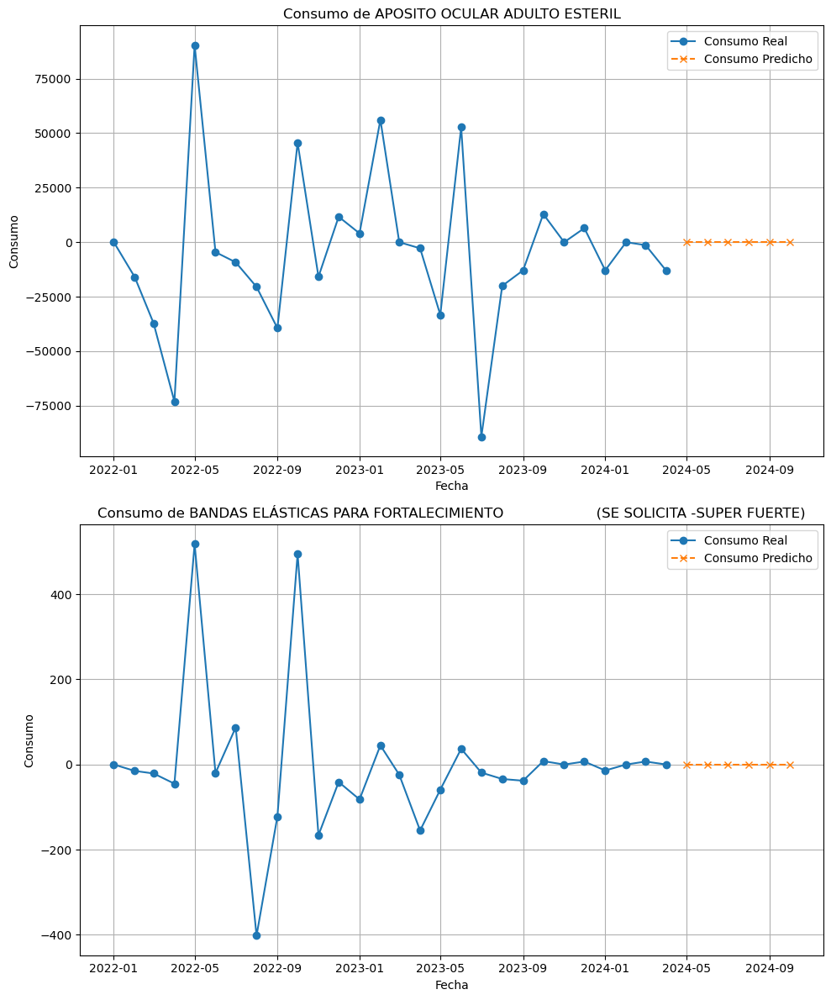

In [48]:
import matplotlib.pyplot as plt

# Seleccionar varios insumos
insumos = ['APOSITO OCULAR ADULTO ESTERIL', 'BANDAS ELÁSTICAS PARA FORTALECIMIENTO                     (SE SOLICITA -SUPER FUERTE)']  # Reemplaza con los nombres de los insumos que quieras graficar

# Crear subplots para cada insumo
fig, axs = plt.subplots(len(insumos), 1, figsize=(10, 6 * len(insumos)))

# Si solo hay un insumo, `axs` no será una lista
if len(insumos) == 1:
    axs = [axs]

for i, insumo in enumerate(insumos):
    df_insumo_consumo = consumption.loc[insumo]
    df_insumo_consumo.index = pd.to_datetime(df_insumo_consumo.index)  # Asegurarse de que el índice sea datetime

    df_pred = df_forecast[df_forecast['Insumo'] == insumo].set_index('Fecha')['Predicción']
    df_pred.index = pd.to_datetime(df_pred.index)  # Asegurarse de que el índice sea datetime

    # Graficar el consumo real
    axs[i].plot(df_insumo_consumo.index, df_insumo_consumo.values, marker='o', label='Consumo Real')

    # Graficar el consumo predicho
    axs[i].plot(df_pred.index, df_pred.values, marker='x', linestyle='--', label='Consumo Predicho')

    # Configurar el título y etiquetas del gráfico
    axs[i].set_title(f'Consumo de {insumo}')
    axs[i].set_xlabel('Fecha')
    axs[i].set_ylabel('Consumo')
    axs[i].grid(True)
    axs[i].legend()

plt.tight_layout()
plt.show()


In [ ]:
df_forecast

## LSTM

In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator
import warnings

# Ignorar warnings de convergencia y otros warnings específicos
warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=FutureWarning)

# Lista para almacenar los resultados y los insumos predecibles
results = []
predecibles_lstm = []

# Definir función para crear el modelo LSTM
def create_model(input_shape):
    model = Sequential()
    model.add(LSTM(50, activation='relu', input_shape=input_shape))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mse')
    return model

for insumo in consumption.index.unique():
    # Filtrar los datos para el insumo actual
    df_insumo_consumo = consumption.loc[insumo]
    
    # Verificar que la serie temporal tenga al menos 12 puntos de datos
    if len(df_insumo_consumo) < 12:
        print(f"Not enough data for {insumo}")
        continue
    
    # Asegurar que los datos tengan frecuencia mensual y eliminar duplicados
    df_insumo_consumo = df_insumo_consumo[~df_insumo_consumo.index.duplicated(keep='first')]
    
    # Escalar los datos
    scaler = MinMaxScaler()
    scaled_data = scaler.fit_transform(df_insumo_consumo.values.reshape(-1, 1))
    
    # Crear secuencias para el modelo LSTM
    generator = TimeseriesGenerator(scaled_data, scaled_data, length=12, batch_size=1)
    
    # Crear y entrenar el modelo
    model = create_model((12, 1))
    model.fit(generator, epochs=100, verbose=0)
    
    # Hacer predicciones para los próximos 6 meses
    pred_list = []
    batch = scaled_data[-12:].reshape((1, 12, 1))
    for i in range(6):
        pred = model.predict(batch)[0]
        pred_list.append(pred)
        batch = np.append(batch[:,1:,:], [[pred]], axis=1)
    
    # Invertir la escala de las predicciones
    forecast = scaler.inverse_transform(pred_list).flatten()
    
    # Almacenar los resultados
    result = pd.DataFrame({
        'Insumo': insumo,
        'Fecha': pd.date_range(start=df_insumo_consumo.index[-1], periods=7, freq='MS')[1:],  # Fechas de predicción
        'Predicción': forecast
    })
    results.append(result)
    predecibles_lstm.append(insumo)

# Convertir los resultados en un DataFrame
df_forecast_lstm = pd.concat(results)

# Mostrar el DataFrame de predicciones
print(df_forecast_lstm)


In [ ]:
import matplotlib.pyplot as plt

# Seleccionar varios insumos
insumos = ['AGUJA HIPODÉRMICA    (SE SOLICITA CALIBRE 22G X 1 1/2 PULGADAS, 38MM DE LONGITUD)']  # Reemplaza con los nombres de los insumos que quieras graficar

# Crear subplots para cada insumo
fig, axs = plt.subplots(len(insumos), 1, figsize=(10, 6 * len(insumos)))

# Si solo hay un insumo, `axs` no será una lista
if len(insumos) == 1:
    axs = [axs]

for i, insumo in enumerate(insumos):
    df_insumo_consumo = consumption.loc[insumo]
    df_insumo_consumo.index = pd.to_datetime(df_insumo_consumo.index)  # Asegurarse de que el índice sea datetime

    df_pred = df_forecast_lstm[df_forecast_lstm['Insumo'] == insumo].set_index('Fecha')['Predicción']
    df_pred.index = pd.to_datetime(df_pred.index)  # Asegurarse de que el índice sea datetime

    # Graficar el consumo real
    axs[i].plot(df_insumo_consumo.index, df_insumo_consumo.values, marker='o', label='Consumo Real')

    # Graficar el consumo predicho
    axs[i].plot(df_pred.index, df_pred.values, marker='x', linestyle='--', label='Consumo Predicho')

    # Configurar el título y etiquetas del gráfico
    axs[i].set_title(f'Consumo de {insumo}')
    axs[i].set_xlabel('Fecha')
    axs[i].set_ylabel('Consumo')
    axs[i].grid(True)
    axs[i].legend()

plt.tight_layout()
plt.show()


## Prophet

In [49]:
import pandas as pd
from prophet import Prophet
import matplotlib.pyplot as plt

# Configuración de Prophet
def train_prophet_model(df):
    df = df.reset_index()
    df.columns = ['ds', 'y']
    model = Prophet()
    model.fit(df)
    return model

# Entrenar el modelo y realizar predicciones
results = []
predecibles_prophet = []

for insumo in consumption.index.unique():
    df_insumo_consumo = consumption.loc[insumo]
    
    # Verificar que la serie temporal tenga al menos 2 puntos de datos
    if len(df_insumo_consumo) < 2:
        print(f"Not enough data for {insumo}")
        continue
    
    # Asegurar que los datos tengan frecuencia mensual y eliminar duplicados
    df_insumo_consumo = df_insumo_consumo[~df_insumo_consumo.index.duplicated(keep='first')]
    
    try:
        # Entrenar el modelo Prophet
        model = train_prophet_model(df_insumo_consumo)
        
        # Hacer predicciones para los próximos 6 meses
        future = model.make_future_dataframe(periods=6, freq='MS')
        forecast = model.predict(future)
        
        # Almacenar los resultados
        result = pd.DataFrame({
            'Insumo': insumo,
            'Fecha': forecast['ds'],
            'Predicción': forecast['yhat']
        })
        results.append(result[result['Fecha'] > df_insumo_consumo.index[-1]])
        predecibles_prophet.append(insumo)
    
    except Exception as e:
        print(f"Error processing {insumo}: {e}")

# Convertir los resultados en un DataFrame
df_forecast_prophet = pd.concat(results)

# Mostrar el DataFrame de predicciones
print(df_forecast_prophet)


22:52:10 - cmdstanpy - INFO - Chain [1] start processing
22:52:10 - cmdstanpy - INFO - Chain [1] done processing
22:52:11 - cmdstanpy - INFO - Chain [1] start processing
22:52:11 - cmdstanpy - INFO - Chain [1] done processing
22:52:11 - cmdstanpy - INFO - Chain [1] start processing
22:52:11 - cmdstanpy - INFO - Chain [1] done processing
22:52:11 - cmdstanpy - INFO - Chain [1] start processing
22:52:11 - cmdstanpy - INFO - Chain [1] done processing
22:52:11 - cmdstanpy - INFO - Chain [1] start processing
22:52:12 - cmdstanpy - INFO - Chain [1] done processing
22:52:12 - cmdstanpy - INFO - Chain [1] start processing
22:52:12 - cmdstanpy - INFO - Chain [1] done processing
22:52:12 - cmdstanpy - INFO - Chain [1] start processing
22:52:12 - cmdstanpy - INFO - Chain [1] done processing
22:52:12 - cmdstanpy - INFO - Chain [1] start processing
22:52:12 - cmdstanpy - INFO - Chain [1] done processing
22:52:13 - cmdstanpy - INFO - Chain [1] start processing
22:52:13 - cmdstanpy - INFO - Chain [1]

                                               Insumo      Fecha  \
28                      APOSITO OCULAR ADULTO ESTERIL 2024-05-01   
29                      APOSITO OCULAR ADULTO ESTERIL 2024-06-01   
30                      APOSITO OCULAR ADULTO ESTERIL 2024-07-01   
31                      APOSITO OCULAR ADULTO ESTERIL 2024-08-01   
32                      APOSITO OCULAR ADULTO ESTERIL 2024-09-01   
..                                                ...        ...   
29  VENDA DE YESO     (SE SOLICITA DE FRAGUADO RÁP... 2024-06-01   
30  VENDA DE YESO     (SE SOLICITA DE FRAGUADO RÁP... 2024-07-01   
31  VENDA DE YESO     (SE SOLICITA DE FRAGUADO RÁP... 2024-08-01   
32  VENDA DE YESO     (SE SOLICITA DE FRAGUADO RÁP... 2024-09-01   
33  VENDA DE YESO     (SE SOLICITA DE FRAGUADO RÁP... 2024-10-01   

       Predicción  
28  204256.704762  
29 -186133.492815  
30   77898.890262  
31  -39823.716070  
32  -84820.324118  
..            ...  
29   -9770.685120  
30    5639.486700  
31 

In [51]:
predecibles_prophet

['APOSITO OCULAR ADULTO ESTERIL',
 'BANDAS ELÁSTICAS PARA FORTALECIMIENTO                     (SE SOLICITA -SUPER FUERTE)',
 'BANDAS ELÁSTICAS PARA FORTALECIMIENTO                     (SE SOLICITA FUERTE) ',
 'BANDAS ELÁSTICAS PARA FORTALECIMIENTO.                    (SE SOLICITA SUAVE)',
 'BOLSA COLECTORA DE ORINA DE 30 A 35 ONZA DE CAPACIDAD     (900CC A 1050CC) DE PIERNA . ',
 'BOLSA INFUSORA A PRESION .SE SOLICITA BOLSA DE 1000cc DE CAPACIDAD',
 'BRAZALETE DE IDENTIFICACIÓN PARA ADULTOS.                (SE SOLICITA: 12 PULGADAS DE LONGITUD)',
 'BRAZALETE DE IDENTIFICACIÓN PEDIATRICA. SE SOLICITA: 8 PULGADAS DE LONGITUD',
 'CANULA NASOFARINGEA  DE 20 FR A  26 FR.  (SE SOLOCITA TAMAÑ0 26FR) ',
 'CANULA NASOFARINGEA  DE 28 FR A 30 FR. SE SOLOCITA TAMAÑ0 28FR   ',
 'CANULA NASOFARINGEA  DE 28 FR A 30 FR. SE SOLOCITA TAMAÑ0 30FR      ',
 'CANULA NASOFARINGEA  DE 32 FR A 36 FR.                        (SE SOLOCITA TAMAÑ0 34FR)',
 'CANULA NASOFARINGEA  DE 32 FR A 36 FR.  (SE SOLOCITA TAMAÑ

In [54]:
# Seleccionar varios insumos
#insumos = ['APOSITO OCULAR ADULTO ESTERIL', 'BANDAS ELÁSTICAS PARA FORTALECIMIENTO                     (SE SOLICITA -SUPER FUERTE)']  # Reemplaza con los nombres de los insumos que quieras graficar
insumos = predecibles_prophet
# Crear subplots para cada insumo
fig, axs = plt.subplots(len(insumos), 1, figsize=(10, 6 * len(insumos)))

# Si solo hay un insumo, `axs` no será una lista
if len(insumos) == 1:
    axs = [axs]

for i, insumo in enumerate(insumos):
    df_insumo_consumo = consumption.loc[insumo]
    df_insumo_consumo.index = pd.to_datetime(df_insumo_consumo.index)  # Asegurarse de que el índice sea datetime

    df_pred = df_forecast_prophet[df_forecast_prophet['Insumo'] == insumo].set_index('Fecha')['Predicción']
    df_pred.index = pd.to_datetime(df_pred.index)  # Asegurarse de que el índice sea datetime

    # Graficar el consumo real
    axs[i].plot(df_insumo_consumo.index, df_insumo_consumo.values, marker='o', label='Consumo Real')

    # Graficar el consumo predicho
    axs[i].plot(df_pred.index, df_pred.values, marker='x', linestyle='--', label='Consumo Predicho')

    # Configurar el título y etiquetas del gráfico
    axs[i].set_title(f'Consumo de {insumo}')
    axs[i].set_xlabel('Fecha')
    axs[i].set_ylabel('Consumo')
    axs[i].grid(True)
    axs[i].legend()

plt.tight_layout()
plt.show()


In [55]:
df_pred

Fecha
2024-05-01    11398.847318
2024-06-01    -9770.685120
2024-07-01     5639.486700
2024-08-01    -7037.112673
2024-09-01    -9001.200846
2024-10-01    -4639.555602
Name: Predicción, dtype: float64

## XGBoost

In [56]:
import pandas as pd
import numpy as np
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import StandardScaler
import warnings

# Ignorar warnings específicos de XGBoost
warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=FutureWarning)

# Función para crear características de retraso
def create_lag_features(df, lags):
    for lag in lags:
        df[f'lag_{lag}'] = df['Consumo'].shift(lag)
    return df

# Obtener la lista de insumos únicos
insumos = consumption.index.unique()

# Lista para almacenar los insumos predecibles y las predicciones
predecibles_xgb = []
results = []

# Definir los retrasos que queremos crear como características
lags = [1, 2, 3, 6, 12]

for insumo in insumos:
    # Filtrar los datos para el insumo actual
    df_insumo_consumo = consumption.loc[insumo].reset_index()
    df_insumo_consumo.columns = ['Fecha', 'Consumo']
    df_insumo_consumo['Fecha'] = pd.to_datetime(df_insumo_consumo['Fecha'])  # Asegurarse de que la columna Fecha sea datetime
    
    # Crear características de retraso
    df_insumo_consumo = create_lag_features(df_insumo_consumo, lags)
    df_insumo_consumo.dropna(inplace=True)
    
    # Verificar que la serie temporal tenga al menos suficientes puntos de datos
    if len(df_insumo_consumo) < 2:
        print(f"Not enough data for {insumo}")
        continue
    
    # Dividir en características y objetivo
    X = df_insumo_consumo.drop(columns=['Fecha', 'Consumo'])
    y = df_insumo_consumo['Consumo']
    
    # Escalar los datos --------------------------------> ESTO PUEDE PROVOCAR FUGA DE INFORMACION A TRAIN SET
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)
    
    # Dividir en conjuntos de entrenamiento y prueba
    X_train, X_test, y_train = X_scaled[:-6], X_scaled[-6:], y[:-6]
    
    # Verificar las dimensiones de los datos
    print(f"Entrenando para {insumo} - X_train shape: {X_train.shape}, y_train shape: {y_train.shape}")
    
    # Definir y entrenar el modelo XGBoost
    model = XGBRegressor(objective='reg:squarederror', n_estimators=1000)
    model.fit(X_train, y_train)
    
    # Hacer predicciones
    y_pred = model.predict(X_test)
    
    # Hacer predicciones para los próximos 6 meses
    future_preds = []
    last_known_features = X_test[-1].reshape(1, -1)
    for _ in range(6):
        pred = model.predict(last_known_features)[0]
        future_preds.append(pred)
        new_features = np.append(last_known_features[:, 1:], pred).reshape(1, -1)
        last_known_features = new_features
    
    future_dates = pd.date_range(start=df_insumo_consumo['Fecha'].iloc[-1] + pd.DateOffset(months=1), periods=6, freq='MS')
    future_df = pd.DataFrame({'Fecha': future_dates, 'Predicción': future_preds, 'Insumo': insumo})
    results.append(future_df)
    predecibles_xgb.append(insumo)
    
    # Calcular el error
    mse = mean_squared_error(y[-6:], y_pred)
    print(f"Insumo: {insumo}, MSE: {mse}")

# Convertir los resultados en un DataFrame
df_forecast_xgb = pd.concat(results)

# Mostrar los insumos predecibles
print("Insumos predecibles con XGBoost:")
print(predecibles_xgb)


Entrenando para APOSITO OCULAR ADULTO ESTERIL - X_train shape: (10, 5), y_train shape: (10,)
Insumo: APOSITO OCULAR ADULTO ESTERIL, MSE: 2002228541.8764584
Entrenando para BANDAS ELÁSTICAS PARA FORTALECIMIENTO                     (SE SOLICITA -SUPER FUERTE) - X_train shape: (10, 5), y_train shape: (10,)
Insumo: BANDAS ELÁSTICAS PARA FORTALECIMIENTO                     (SE SOLICITA -SUPER FUERTE), MSE: 1076.337740892329
Entrenando para BANDAS ELÁSTICAS PARA FORTALECIMIENTO                     (SE SOLICITA FUERTE)  - X_train shape: (10, 5), y_train shape: (10,)
Insumo: BANDAS ELÁSTICAS PARA FORTALECIMIENTO                     (SE SOLICITA FUERTE) , MSE: 53134.21727665429
Entrenando para BANDAS ELÁSTICAS PARA FORTALECIMIENTO.                    (SE SOLICITA SUAVE) - X_train shape: (10, 5), y_train shape: (10,)
Insumo: BANDAS ELÁSTICAS PARA FORTALECIMIENTO.                    (SE SOLICITA SUAVE), MSE: 913.4828381841326
Entrenando para BOLSA COLECTORA DE ORINA DE 30 A 35 ONZA DE CAPACIDAD  

In [58]:
import matplotlib.pyplot as plt

# Seleccionar varios insumos
#insumos = ['AGUJA HIPODÉRMICA    (SE SOLICITA CALIBRE 22G X 1 1/2 PULGADAS, 38MM DE LONGITUD)']  # Reemplaza con los nombres de los insumos que quieras graficar
insumos = predecibles_xgb
# Crear subplots para cada insumo
fig, axs = plt.subplots(len(insumos), 1, figsize=(10, 6 * len(insumos)))

# Si solo hay un insumo, `axs` no será una lista
if len(insumos) == 1:
    axs = [axs]

for i, insumo in enumerate(insumos):
    df_insumo_consumo = consumption.loc[insumo].reset_index()
    df_insumo_consumo.columns = ['Fecha', 'Consumo']
    df_insumo_consumo['Fecha'] = pd.to_datetime(df_insumo_consumo['Fecha'])  # Asegurarse de que el índice sea datetime

    df_pred = df_forecast_xgb[df_forecast_xgb['Insumo'] == insumo].set_index('Fecha')['Predicción']
    df_pred.index = pd.to_datetime(df_pred.index)  # Asegurarse de que el índice sea datetime
    
    # Graficar el consumo real
    axs[i].plot(df_insumo_consumo['Fecha'], df_insumo_consumo['Consumo'], marker='o', label='Consumo Real')

    # Graficar el consumo predicho
    axs[i].plot(df_pred.index, df_pred.values, marker='x', linestyle='--', label='Consumo Predicho')

    # Configurar el título y etiquetas del gráfico
    axs[i].set_title(f'Consumo de {insumo}')
    axs[i].set_xlabel('Fecha')
    axs[i].set_ylabel('Consumo')
    axs[i].grid(True)
    axs[i].legend()

plt.tight_layout()
plt.show()

In [59]:
df_pred

Fecha
2024-05-01    -9939.789062
2024-06-01   -12979.997070
2024-07-01     -217.190964
2024-08-01   -10063.999023
2024-09-01    -5964.000977
2024-10-01     1296.365845
Name: Predicción, dtype: float32

In [60]:
df_forecast_xgb

,Fecha,Predicción,Insumo
0,2024-05-01,51135.589844,APOSITO OCULAR ADULTO ESTERIL
1,2024-06-01,5332.664551,APOSITO OCULAR ADULTO ESTERIL
2,2024-07-01,51280.308594,APOSITO OCULAR ADULTO ESTERIL
3,2024-08-01,-11428.935547,APOSITO OCULAR ADULTO ESTERIL
4,2024-09-01,-33324.984375,APOSITO OCULAR ADULTO ESTERIL
...,...,...,...
1,2024-06-01,-12979.997070,VENDA DE YESO (SE SOLICITA DE FRAGUADO RÁP...
2,2024-07-01,-217.190964,VENDA DE YESO (SE SOLICITA DE FRAGUADO RÁP...
3,2024-08-01,-10063.999023,VENDA DE YESO (SE SOLICITA DE FRAGUADO RÁP...
4,2024-09-01,-5964.000977,VENDA DE YESO (SE SOLICITA DE FRAGUADO RÁP...
